In [43]:
%pip install findspark
%pip install pandas scikit-learn

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [1]:
from pyspark.sql import SparkSession
import os
import findspark
from pyspark.sql import SparkSession
from pyspark.sql import SQLContext
import pandas as pd
import numpy as np
from pyspark.sql.functions import col, when, split, explode, regexp_replace, lower, lit, udf, trim

In [2]:
try:
  import google.colab
  IN_COLAB = True
except:
  IN_COLAB = False

In [3]:
if IN_COLAB:
    !apt-get install openjdk-8-jdk-headless -qq > /dev/null
    !wget -q https://archive.apache.org/dist/spark/spark-3.3.2/spark-3.3.2-bin-hadoop3.tgz
    !tar xf spark-3.3.2-bin-hadoop3.tgz
    !mv spark-3.3.2-bin-hadoop3 spark
    %pip install -q findspark
    import os
    # os.environ["JAVA_HOME"] = "/usr/lib/jvm/java-8-openjdk-amd64"
    # os.environ["SPARK_HOME"] = "/content/spark"

In [4]:
# Initialize Spark environment
findspark.init()

# Define Spark session
spark = SparkSession.builder\
    .appName("High Memory Spark Job")\
    .master("local[*]")\
    .config("spark.executor.memory", "70g")\
    .config("spark.driver.memory", "50g")\
    .config("spark.memory.offHeap.enabled", True)\
    .config("spark.memory.offHeap.size", "16g")\
    .getOrCreate()

In [5]:
sc = spark.sparkContext

In [4]:
sc

<SparkContext master=local[*] appName=High Memory Spark Job>

In [24]:
data_file = spark.read.format("csv") \
            .option("header", "true") \
            .load("data/features_summation.csv")

In [26]:
df_data_file = pd.read_csv("data/features_summation.csv", encoding='utf-8')

In [25]:
data_file.show(5)

+--------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|          file|       organizations|     classifications|        affiliations|       auth-keywords|            subjects|             authors|           reference|               title|        publish_name|
+--------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|201800000.json|"['Department of ...| 'Stanford Univer...| 'Department of R...| 'Stanford Univer...|['ASJC', 'SUBJABBR']|['Stanford Univer...|              [None]|  ['Medicine (all)']|['Pongpirul K.', ...|
|201800001.json|['Department of E...|['ASJC', 'CPXCLAS...|['Chulalongkorn U...|              [None]|['Electrical and ...|['Pratumsiri T.',...|['Proc. CAMA 2015...|Flexible Prin

In [27]:
df_data_file.head(5)

,file,organizations,classifications,affiliations,auth-keywords,subjects,authors,reference,title,publish_name
0,201800000.json,['Department of Preventive and Social Medicine...,"['ASJC', 'SUBJABBR']","['Stanford University School of Medicine', 'Ch...",[None],['Medicine (all)'],"['Pongpirul K.', 'Lungren M.P.']","['Science.', 'The future of public health', 'I...",Public health and international epidemiology f...,"Radiology in Global Health: Strategies, Implem..."
1,201800001.json,"['Department of Electrical Engineering', 'Wire...","['ASJC', 'CPXCLASS', 'FLXCLASS', 'SUBJABBR']",['Chulalongkorn University'],[None],"['Electrical and Electronic Engineering', 'Ele...","['Pratumsiri T.', 'Janpugdee P.']","['Proc. CAMA 2015', 'Proc. 2015 Thailand-Japan...",Flexible Printed Active Antenna for Digital Te...,Progress in Electromagnetics Research Symposium
2,201800002.json,['Center of Excellence in Catalysis and Cataly...,"['CPXCLASS', 'ENCOMPASSCLASS', 'FLXCLASS', 'AS...",['Chulalongkorn University'],"['Circulating fluidized bed', 'Computational f...","['Chemistry (all)', 'Chemical Engineering (all...","['Phuakpunk K.', 'Chalermsinsuwan B.', 'Putivi...","['AICHE J.', 'Int. J. Hydrog. Energy', 'Chem. ...",Parametric study of hydrogen production via so...,Chemical Engineering Science
3,201800003.json,"['Department of Chemistry', 'Faculty of Scienc...","['CPXCLASS', 'FLXCLASS', 'ASJC', 'SUBJABBR']","['Hirosaki University', 'Chulalongkorn Univers...","['Encapsulation', 'Fluoroalkylsilane', 'Natura...","['Chemistry (all)', 'Condensed Matter Physics'...","['Saengkaew J.', 'Le D.', 'Samart C.', 'Sawada...","['Desalination', 'J. Membr. Sci.', 'Appl. Cata...",Superhydrophobic coating from fluoroalkylsilan...,Applied Surface Science
4,201800004.json,"['Program in Petrochemistry', 'Faculty of Scie...","['EMCLASS', 'ASJC', 'SUBJABBR']","['Chulalongkorn University', 'Thailand Nationa...","['acpcPNA', 'Electrochemical impedance spectro...","['Analytical Chemistry', 'Biochemistry', 'Envi...","['Teengam P.', 'Siangproh W.', 'Tuantranont A....","['Int. J. Tubercul. Lung Dis.', 'Lancet Infect...",Electrochemical impedance-based DNA sensor usi...,Analytica Chimica Acta


In [21]:
data_file.printSchema()

root
 |-- file: string (nullable = true)
 |-- organizations: string (nullable = true)
 |-- classifications: string (nullable = true)
 |-- affiliations: string (nullable = true)
 |-- auth-keywords: string (nullable = true)
 |-- subjects: string (nullable = true)
 |-- authors: string (nullable = true)
 |-- reference: string (nullable = true)
 |-- title: string (nullable = true)
 |-- publish_name: string (nullable = true)



In [22]:
data_file.columns

['file',
 'organizations',
 'classifications',
 'affiliations',
 'auth-keywords',
 'subjects',
 'authors',
 'reference',
 'title',
 'publish_name']

### Remove Null

Drop columns that are not use

In [10]:
data_file_clean_1 = data_file.drop('file', 'authors')
data_file_clean_1.show(5)

+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|       organizations|     classifications|        affiliations|       auth-keywords|            subjects|           reference|               title|        publish_name|
+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|"['Department of ...| 'Stanford Univer...| 'Department of R...| 'Stanford Univer...|['ASJC', 'SUBJABBR']|              [None]|  ['Medicine (all)']|['Pongpirul K.', ...|
|['Department of E...|['ASJC', 'CPXCLAS...|['Chulalongkorn U...|              [None]|['Electrical and ...|['Proc. CAMA 2015...|Flexible Printed ...|Progress in Elect...|
|['Center of Excel...|['CPXCLASS', 'ENC...|['Chulalongkorn U...|['Circulating flu...|['Chemistry (all)...|['AICHE J.', 'Int...|Parametric study ...|Ch

Replace column that has value [None] to nan

In [11]:
data_file_clean_1 = data_file_clean_1.select([when((col(c) == '[None]') | (col(c) == '[]'), None).otherwise(col(c)).alias(c) for c in data_file_clean_1.columns])
data_file_clean_1.show(5)

+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|       organizations|     classifications|        affiliations|       auth-keywords|            subjects|           reference|               title|        publish_name|
+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|"['Department of ...| 'Stanford Univer...| 'Department of R...| 'Stanford Univer...|['ASJC', 'SUBJABBR']|                NULL|  ['Medicine (all)']|['Pongpirul K.', ...|
|['Department of E...|['ASJC', 'CPXCLAS...|['Chulalongkorn U...|                NULL|['Electrical and ...|['Proc. CAMA 2015...|Flexible Printed ...|Progress in Elect...|
|['Center of Excel...|['CPXCLASS', 'ENC...|['Chulalongkorn U...|['Circulating flu...|['Chemistry (all)...|['AICHE J.', 'Int...|Parametric study ...|Ch

In [12]:
data_file_clean_1.describe().show()

+-------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|summary|       organizations|     classifications|        affiliations|       auth-keywords|            subjects|           reference|               title|        publish_name|
+-------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|  count|               20194|               20216|               20216|               16985|               20186|               19836|               20200|               20196|
|   mean|                NULL|                NULL|                NULL|                NULL|                NULL|                NULL|                NULL|              4326.0|
| stddev|                NULL|                NULL|                NULL|                NULL|                N

Find percent of null each columns

In [13]:
from pyspark.sql.functions import col, isnan, when, count

# Calculate the percentage of null values in each column
null_percent_df = data_file_clean_1.select([(count(when(col(c).isNull(), c)) / data_file_clean_1.count()).alias(c) for c in data_file_clean_1.columns])

# Show the result
null_percent_df.show()

+--------------------+---------------+------------+-------------------+-------------------+--------------------+--------------------+--------------------+
|       organizations|classifications|affiliations|      auth-keywords|           subjects|           reference|               title|        publish_name|
+--------------------+---------------+------------+-------------------+-------------------+--------------------+--------------------+--------------------+
|0.001088246933122...|            0.0|         0.0|0.15982390185991294|0.00148397309062129|0.018796992481203006|7.914523149980214E-4|9.893153937475267E-4|
+--------------------+---------------+------------+-------------------+-------------------+--------------------+--------------------+--------------------+



Decide to drop null row instead

In [14]:
data_file_clean_2 = data_file_clean_1.dropna()
data_file_clean_2.show(5)

+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|       organizations|     classifications|        affiliations|       auth-keywords|            subjects|           reference|               title|        publish_name|
+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|['Center of Excel...|['CPXCLASS', 'ENC...|['Chulalongkorn U...|['Circulating flu...|['Chemistry (all)...|['AICHE J.', 'Int...|Parametric study ...|Chemical Engineer...|
|['Department of C...|['CPXCLASS', 'FLX...|['Hirosaki Univer...|['Encapsulation',...|['Chemistry (all)...|['Desalination', ...|Superhydrophobic ...|Applied Surface S...|
|['Program in Petr...|['EMCLASS', 'ASJC...|['Chulalongkorn U...|['acpcPNA', 'Elec...|['Analytical Chem...|['Int. J. Tubercu...|Electrochemical i...|An

In [15]:
from pyspark.sql.functions import col, isnan, when, count

# Calculate the percentage of null values in each column
null_percent_df_2 = data_file_clean_2.select([(count(when(col(c).isNull(), c)) / data_file_clean_2.count()).alias(c) for c in data_file_clean_2.columns])

# Show the result
null_percent_df_2.show()

+-------------+---------------+------------+-------------+--------+---------+-----+------------+
|organizations|classifications|affiliations|auth-keywords|subjects|reference|title|publish_name|
+-------------+---------------+------------+-------------+--------+---------+-----+------------+
|          0.0|            0.0|         0.0|          0.0|     0.0|      0.0|  0.0|         0.0|
+-------------+---------------+------------+-------------+--------+---------+-----+------------+



Drop duplicate

In [16]:
data_file_clean_2.dropDuplicates()

DataFrame[organizations: string, classifications: string, affiliations: string, auth-keywords: string, subjects: string, reference: string, title: string, publish_name: string]

In [17]:
data_file_clean_2.describe().show()

+-------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|summary|       organizations|     classifications|        affiliations|       auth-keywords|            subjects|           reference|               title|        publish_name|
+-------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|  count|               16783|               16783|               16783|               16783|               16783|               16783|               16783|               16783|
|   mean|                NULL|                NULL|                NULL|                NULL|                NULL|                NULL|                NULL|              4326.0|
| stddev|                NULL|                NULL|                NULL|                NULL|                N

In [18]:
df_data_file_clean_2 = data_file_clean_2.toPandas()

In [19]:
df_data_file_clean_2.to_csv('data/features_summation_cleaned.csv', index=False)

### Subjects

In [31]:
data_file_clean_subject = data_file_clean_2.drop_duplicates()

In [32]:
data_file_clean_subject.printSchema()

root
 |-- organizations: string (nullable = true)
 |-- classifications: string (nullable = true)
 |-- affiliations: string (nullable = true)
 |-- auth-keywords: string (nullable = true)
 |-- subjects: string (nullable = true)
 |-- reference: string (nullable = true)
 |-- title: string (nullable = true)
 |-- publish_name: string (nullable = true)



In [33]:
# Split the subjects column into an array
data_file_clean_subject = data_file_clean_subject.withColumn('subject', explode(split(col('subjects'), ',')))

# Clean the subject values by removing unwanted characters and trimming whitespace
data_file_clean_subject = data_file_clean_subject.withColumn('subject', trim(regexp_replace('subject', r'[\[\]\"\']', '')))

# Remove parentheses and their contents in each subject
data_file_clean_subject = data_file_clean_subject.withColumn('subject', regexp_replace('subject', r'\(.*?\)', ''))

# Convert the subject column to lowercase
data_file_clean_subject = data_file_clean_subject.withColumn('subject', lower(col('subject')))

# Drop row that subject not utf-8 characters
data_file_clean_subject = data_file_clean_subject.filter(col('subject').rlike('^[a-zA-Z0-9 ]+$'))

# Drop the original subjects column
data_file_clean_subject = data_file_clean_subject.drop('subjects')


In [34]:
data_file_clean_subject.show(5)

+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|       organizations|     classifications|        affiliations|       auth-keywords|           reference|               title|        publish_name|             subject|
+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|['Graduate Divisi...|['ASJC', 'SUBJABBR']|['Chulalongkorn U...|['Nongenomic acti...|['Mol Cell Endocr...|Nongenomic effect...|         ScienceAsia|   multidisciplinary|
|"['Centre for Pas...| 'Division of Hyd...| 'Desert Research...| 'School of Geogr...| 'Arizona State U...| 'Institute of Sc...| 'Hebrew Universi...|university of mel...|
|['Department of F...|['ASJC', 'SUBJABBR']|['Chulalongkorn U...|['Antimicrobial',...|['Biomaterials', ...|Fabrication and c...|  Food Hydrocolloids|  

In [35]:
data_file_clean_subject = data_file_clean_subject.dropDuplicates()

In [36]:
# Drop rows where 'subject' is null
data_file_clean_subject = data_file_clean_subject.dropna(subset=['subject'])

In [37]:
data_file_clean_subject.printSchema()

root
 |-- organizations: string (nullable = true)
 |-- classifications: string (nullable = true)
 |-- affiliations: string (nullable = true)
 |-- auth-keywords: string (nullable = true)
 |-- reference: string (nullable = true)
 |-- title: string (nullable = true)
 |-- publish_name: string (nullable = true)
 |-- subject: string (nullable = false)



In [44]:
data_file_clean_subject.dropDuplicates()

DataFrame[organizations: string, classifications: string, affiliations: string, auth-keywords: string, reference: string, title: string, publish_name: string, subject: string]

In [45]:
df_data_file_clean_3 = data_file_clean_subject.toPandas()

In [46]:
df_data_file_clean_3.shape

(45880, 8)

In [47]:
df_data_file_clean_3.to_csv('data/features_summation_cleaned_subject.csv', index=False)

### Publish name

In [48]:
data_file_clean_publish_name = data_file_clean_subject.drop_duplicates()

In [49]:
# Clean the publish_name values by removing unwanted characters
data_file_clean_publish_name = data_file_clean_publish_name.withColumn('publish_name', trim(regexp_replace('publish_name', r'[\[\]\"\']', '')))

# Convert the publish_name column to lowercase
data_file_clean_publish_name = data_file_clean_publish_name.withColumn('publish_name', lower(col('publish_name')))

# Drop row that subject not utf-8 characters
data_file_clean_publish_name = data_file_clean_publish_name.filter(col('publish_name').rlike('^[a-zA-Z0-9 ]+$'))

data_file_clean_publish_name.show(5)

+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+------------------+
|       organizations|     classifications|        affiliations|       auth-keywords|           reference|               title|        publish_name|           subject|
+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+------------------+
|['Key Laboratory ...|['CPXCLASS', 'FLX...|['Hunan Universit...|['Carbon nanofibe...|['Int. J. Mater. ...|Mechanical and mi...|construction and ...|materials science |
|['Department of H...|['EMCLASS', 'ASJC...|['Academic Model ...|['adherence', 'ch...|['Fact Sheet Worl...|Validation of a s...|journal of the in...|     public health|
|['Department of P...|['CPXCLASS', 'EMC...|['Universidad Aut...|['Electrochemical...|['Nature', 'Oncog...|Heterostructures ...|journal of colloi...|          su

In [50]:
data_file_clean_publish_name.describe().show()

+-------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+-------------------+
|summary|       organizations|     classifications|        affiliations|       auth-keywords|           reference|               title|        publish_name|            subject|
+-------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+-------------------+
|  count|               36018|               36018|               36018|               36018|               36018|               36018|               36018|              36018|
|   mean|                NULL|                NULL|                NULL|                NULL|                NULL|                NULL|              2015.0|               NULL|
| stddev|                NULL|                NULL|                NULL|                NULL|                NULL| 

In [56]:
data_col_publish_name = data_file_clean_publish_name.filter(col('publish_name').isNotNull())
data_col_publish_name = data_col_publish_name.groupBy('publish_name').count().sort(col('count').desc())
data_col_publish_name = data_col_publish_name.filter(col('count') > 20)
data_col_publish_name.describe().show()

+-------+------------+-----------------+
|summary|publish_name|            count|
+-------+------------+-----------------+
|  count|         292|              292|
|   mean|        NULL|61.94178082191781|
| stddev|        NULL|71.37746355361044|
|    min|   3 biotech|               21|
|    max|     zootaxa|              651|
+-------+------------+-----------------+



In [57]:
# Select the publish names from data_col_publish_name
publish_names = data_col_publish_name.select('publish_name').distinct()

# Join data_file_clean_publish with publish_names to keep only the rows with matching publish names
data_file_clean_publish_filtered = data_file_clean_publish_name.join(publish_names, on='publish_name', how='inner')

# Show the result
data_file_clean_publish_filtered.show(5)

+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+------------------+
|        publish_name|       organizations|     classifications|        affiliations|       auth-keywords|           reference|               title|           subject|
+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+------------------+
|construction and ...|['Key Laboratory ...|['CPXCLASS', 'FLX...|['Hunan Universit...|['Carbon nanofibe...|['Int. J. Mater. ...|Mechanical and mi...|materials science |
|journal of the in...|['Department of H...|['EMCLASS', 'ASJC...|['Academic Model ...|['adherence', 'ch...|['Fact Sheet Worl...|Validation of a s...|     public health|
|journal of colloi...|['Department of P...|['CPXCLASS', 'EMC...|['Universidad Aut...|['Electrochemical...|['Nature', 'Oncog...|Heterostructures ...|          su

In [58]:
data_file_clean_publish_filtered.describe().show()

+-------+------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|summary|publish_name|       organizations|     classifications|        affiliations|       auth-keywords|           reference|               title|             subject|
+-------+------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|  count|       18087|               18087|               18087|               18087|               18087|               18087|               18087|               18087|
|   mean|        NULL|                NULL|                NULL|                NULL|                NULL|                NULL|                NULL|                NULL|
| stddev|        NULL|                NULL|                NULL|                NULL|                NULL|                NULL|                NULL|  

In [61]:
data_file_clean_4 = data_file_clean_publish_filtered.drop_duplicates()
df_data_file_clean_publish_filtered = data_file_clean_publish_filtered.toPandas()

In [62]:
df_data_file_clean_publish_filtered.to_csv('data/features_summation_cleaned_publish_name.csv', index=False, encoding='utf-8')

### Title

In [64]:
data_file_clean_5 = data_file_clean_4.drop_duplicates()
data_file_clean_5 = data_file_clean_5.drop('title')

In [65]:
data_file_clean_5.describe().show()

+-------+------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|summary|publish_name|       organizations|     classifications|        affiliations|       auth-keywords|           reference|             subject|
+-------+------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|  count|       18087|               18087|               18087|               18087|               18087|               18087|               18087|
|   mean|        NULL|                NULL|                NULL|                NULL|                NULL|                NULL|                NULL|
| stddev|        NULL|                NULL|                NULL|                NULL|                NULL|                NULL|                NULL|
|    min|   3 biotech|"[""Center for Wa...| ""Division of Wo...| ""King Mongkut's...| ""Brigham and Wo...|

In [66]:
df_data_file_clean_5 = data_file_clean_5.toPandas()
df_data_file_clean_5.to_csv('data/features_summation_drop_title.csv', index=False, encoding='utf-8')

### Classification

In [67]:
data_file_clean_classification = data_file_clean_5.drop_duplicates()

In [68]:
data_file_clean_classification.describe().show()

+-------+------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|summary|publish_name|       organizations|     classifications|        affiliations|       auth-keywords|           reference|             subject|
+-------+------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|  count|       18087|               18087|               18087|               18087|               18087|               18087|               18087|
|   mean|        NULL|                NULL|                NULL|                NULL|                NULL|                NULL|                NULL|
| stddev|        NULL|                NULL|                NULL|                NULL|                NULL|                NULL|                NULL|
|    min|   3 biotech|"[""Center for Wa...| ""Division of Wo...| ""King Mongkut's...| ""Brigham and Wo...|

In [69]:
# Split the classifications column into an array
data_file_clean_classification = data_file_clean_classification.withColumn('classification', explode(split(col('classifications'), ',')))

# Clean the classification values by removing unwanted characters and trimming whitespace
data_file_clean_classification = data_file_clean_classification.withColumn('classification', trim(regexp_replace('classification', r'[\[\]\"\']', '')))

# Drop the original classifications column
data_file_clean_classification = data_file_clean_classification.drop('classifications')

# Show the result
data_file_clean_classification.show(5)

+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------+
|        publish_name|       organizations|        affiliations|       auth-keywords|           reference|             subject|classification|
+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------+
|journal of health...|['College of Publ...|['Chulalongkorn U...|['Antibiotic resi...|['What is antimic...|       health policy|          ASJC|
|journal of health...|['College of Publ...|['Chulalongkorn U...|['Antibiotic resi...|['What is antimic...|       health policy|      SUBJABBR|
|journal of health...|['Department of P...|['Duke-NUS Medica...|['Adult', 'Dental...|['Department of H...|environmental and...|          ASJC|
|journal of health...|['Department of P...|['Duke-NUS Medica...|['Adult', 'Dental...|['Department of H...|environmental and...|      SUBJABBR|

In [70]:
data_file_clean_classification.describe().show()

+-------+------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|summary|publish_name|       organizations|        affiliations|       auth-keywords|           reference|             subject|      classification|
+-------+------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|  count|       60848|               60848|               60848|               60848|               60848|               60848|               60848|
|   mean|        NULL|                NULL|                NULL|                NULL|                NULL|                NULL|                NULL|
| stddev|        NULL|                NULL|                NULL|                NULL|                NULL|                NULL|                NULL|
|    min|   3 biotech|"[""Center for Wa...| ""King Mongkut's...| ""Brigham and Wo...| 'Center of Excel...|

In [71]:
data_col_classification = data_file_clean_classification.filter(col('classification').isNotNull())
data_col_classification = data_col_classification.groupBy('classification').count().sort(col('count').desc())
data_col_classification.show()

+--------------------+-----+
|      classification|count|
+--------------------+-----+
|            SUBJABBR|17906|
|                ASJC|17906|
|            FLXCLASS| 6884|
|            CPXCLASS| 6852|
|             EMCLASS| 6077|
|           CABSCLASS| 2002|
|            GEOCLASS| 1862|
|      ENCOMPASSCLASS| 1178|
|          IN2P3-CNRS|  116|
|School of Informa...|    6|
|Social Research I...|    2|
|Computational Pro...|    2|
|Research Unit of ...|    2|
|Control and Syste...|    2|
|Center of Excelle...|    2|
|       Guys Hospital|    2|
|Department of Ele...|    2|
|Department of Ele...|    1|
|   Ratchaburi Campus|    1|
|College of Advanc...|    1|
+--------------------+-----+
only showing top 20 rows



### Select Delete Publish Name <= 6 (75% Down)

Looking in publish_name

In [20]:
data_col_publish = data_file_clean_subject.select('publish_name')
data_col_publish.describe().show()

+-------+--------------------+
|summary|        publish_name|
+-------+--------------------+
|  count|               45880|
|   mean|              4326.0|
| stddev|                NULL|
|    min| "" International...|
|    max|         rEFLections|
+-------+--------------------+



In [21]:
# Clean the publish_name values by removing unwanted characters
data_col_publish = data_col_publish.withColumn('publish_name', trim(regexp_replace('publish_name', r'[\[\]\"\']', '')))

# Convert the publish_name column to lowercase
data_col_publish = data_col_publish.withColumn('publish_name', lower(col('publish_name')))

# Drop row that subject not utf-8 characters
data_col_publish = data_col_publish.filter(col('publish_name').rlike('^[a-zA-Z0-9 ]+$'))

data_col_publish.show(5)

+--------------------+
|        publish_name|
+--------------------+
|construction and ...|
|journal of the in...|
|journal of colloi...|
|international jou...|
|international jou...|
+--------------------+
only showing top 5 rows



In [22]:
# Group by publish_name and count the occurrences
publish_name_counts = data_col_publish.groupBy('publish_name').count()
publish_name_counts = publish_name_counts.orderBy(col('count').desc())
# Show the result

In [23]:
publish_name_counts.show(publish_name_counts.count(), truncate=False)

+--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+-----+
|publish_name                                                                                                                                                                                            |count|
+--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+-----+
|molecules                                                                                                                                                                                               |651  |
|international journal of molecular sciences                                                                                                                        

In [24]:
publish_name_counts.describe().show()

+-------+--------------------+------------------+
|summary|        publish_name|             count|
+-------+--------------------+------------------+
|  count|                4558|              4558|
|   mean|              2015.0| 7.902150065818342|
| stddev|                NULL|23.227606287821608|
|    min|2006 internationa...|                 1|
|    max|             zootaxa|               651|
+-------+--------------------+------------------+



In [30]:
percentiles = [0.25, 0.5, 0.75]
quantiles = publish_name_counts.approxQuantile("count", percentiles, 0.01)

print("25%:", quantiles[0])
print("50% (Median):", quantiles[1])
print("75%:", quantiles[2])

25%: 2.0
50% (Median): 3.0
75%: 6.0


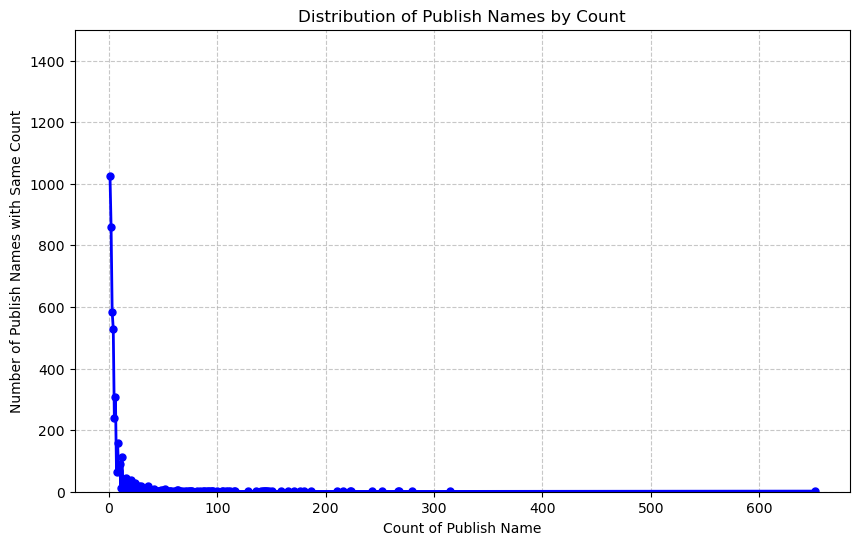

In [ ]:
import matplotlib.pyplot as plt

# Convert the publish_name_counts DataFrame to Pandas
publish_name_counts_pd = publish_name_counts.toPandas()

# Group by 'count' and count the occurrences
count_of_publish_name = publish_name_counts_pd.groupby('count').size().reset_index(name='publish_name_count')

# Plot the graph as a line chart
plt.figure(figsize=(10, 6))
plt.plot(
    count_of_publish_name['count'],  # X-axis
    count_of_publish_name['publish_name_count'],  # Y-axis
    color='blue', marker='o', linestyle='-', linewidth=1, markersize=0
)
plt.xlabel('Count of Publish Name')
plt.ylabel('Number of Publish Names with Same Count')
plt.title('Distribution of Publish Names by Count')
plt.ylim(0, 1200)  # Set Y-axis limit
plt.grid(True, linestyle='--', alpha=0.7)  # Add grid for better readability
plt.show()


In [42]:
publish_name_counts_lower = publish_name_counts.where(col('count')<=1)
publish_name_counts_lower.describe().show()

+-------+--------------------+-----+
|summary|        publish_name|count|
+-------+--------------------+-----+
|  count|                4378| 4378|
|   mean|              3170.5|  1.0|
| stddev|  1634.1237713221112|  0.0|
|    min|-Research Department|    1|
|    max|with BPMN Impleme...|    1|
+-------+--------------------+-----+



### Organiaztion

Looking in organization

In [16]:
data_col_organization = data_file_clean_2.select('organizations')
data_col_organization.describe().show()

+-------+--------------------+
|summary|       organizations|
+-------+--------------------+
|  count|               16783|
|   mean|                NULL|
| stddev|                NULL|
|    min|"[""Center for Wa...|
|    max|['the Division of...|
+-------+--------------------+



In [20]:
# Split the organizations column into an array
data_col_organization_split = data_col_organization.withColumn('organization', explode(split(col('organizations'), ',')))

# Clean the organization values by removing '[]'
data_col_organization_split_clean = data_col_organization_split.withColumn('organization', regexp_replace('organization', r'[\[\]\"]', ''))

# Group by organization and count the occurrences
organization_counts_split_clean = data_col_organization_split_clean.groupBy('organization').count()

# Show the result
organization_counts_split_clean.show(5)

+--------------------+-----+
|        organization|count|
+--------------------+-----+
| 'Izmir Institute...|  209|
| 'Kyushu University'|   47|
| 'Geisel School o...|    2|
| 'Kasetsart Unive...|   14|
| 'Federal Univers...|    2|
+--------------------+-----+
only showing top 5 rows



In [21]:
organization_counts_split_clean.show(organization_counts_split_clean.count(), truncate=False)

+---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+-----+
|organization                                                                                                                                                                                                               |count|
+---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+-----+
| 'Izmir Institute of Technology'                                                                                                                                                                                           |209  |
| 'Kyushu University'                                                                   

In [ ]:
organization_counts_split_clean = organization_counts_split.withColumn('organization', regexp_replace('organization', r'[\[\]]', ''))
organization_counts_split_clean.show(5)

In [66]:
organization_counts = data_col_organization.groupBy('organizations').count()
organization_counts = organization_counts.withColumnRenamed('organizations', 'organization').withColumnRenamed('count', 'count')
organization_counts.show()

+--------------------+-----+
|        organization|count|
+--------------------+-----+
|['Division of Der...|    1|
|['State Key Labor...|    1|
|['Yerevan Physics...|    1|
|"['Yerevan Physic...|    2|
|['Animal Vector-B...|    1|
|['Department of V...|    1|
|['Department of B...|    1|
|['School of Nursi...|    1|
|['Geotechnical Re...|    1|
|['Division of Car...|    1|
|"['Yerevan Physic...|   13|
|['State Key Labor...|    1|
|['Department of B...|    2|
|['Department of C...|    1|
|['Microbial Techn...|    1|
|['Chulalongkorn U...|    1|
|['College of Publ...|    1|
|['Department of C...|    1|
|['Yerevan Physics...|    1|
|['Department of B...|    1|
+--------------------+-----+
only showing top 20 rows



+-------+--------------------+
|summary|       organizations|
+-------+--------------------+
|  count|               16790|
|   mean|                NULL|
| stddev|                NULL|
|    min|"[""Center for Wa...|
|    max|['the Division of...|
+-------+--------------------+



In [46]:
data_col_organization.groupBy('organizations').count().orderBy('count', asending = True).show()

+--------------------+-----+
|       organizations|count|
+--------------------+-----+
|['Chulalongkorn U...|    1|
|['Biochemistry Un...|    1|
|['The Petroleum a...|    1|
|['Department of O...|    1|
|['IMPACT Strategi...|    1|
|['Hematology', 'O...|    1|
|['Yerevan Physics...|    1|
|['Tir Na Nog', 'I...|    1|
|['Faculdade de Ci...|    1|
|['Department of D...|    1|
|['Departamento de...|    1|
|['Hanoi Universit...|    1|
|['Department of G...|    1|
|['Malaria Functio...|    1|
|['Department of C...|    1|
|['Yerevan Physics...|    1|
|['Yerevan Physics...|    1|
|['International R...|    1|
|['College of Publ...|    1|
|['Department of C...|    1|
+--------------------+-----+
only showing top 20 rows



### Try Idea

In [6]:
try_data_file = data_file.drop('file', 'authors', 'title','reference')

In [7]:
from pyspark.sql import functions as F

In [16]:
# Get the list of columns in data_file
columns = data_file.columns

# Iterate over each column and apply explode and clean operations
for column in columns:
    # Check if the column is of type STRING
    if dict(data_file.dtypes)[column] == 'string':
        # Split the column into an array
        data_file = data_file.withColumn(column, F.split(F.col(column), ','))

    # Explode the array to create multiple rows per element
    data_file = data_file.withColumn(column, F.explode(F.col(column)))

    # Clean the column values by removing unwanted characters
    data_file = data_file.withColumn(column, F.trim(F.regexp_replace(F.col(column), r'[\[\]\"\']', '')))

# Show the result
data_file.show(5)


+--------------------+---------------+--------------------+-------------+----------+--------------------+--------------------+
|       organizations|classifications|        affiliations|auth-keywords|  subjects|           reference|        publish_name|
+--------------------+---------------+--------------------+-------------+----------+--------------------+--------------------+
|Departments of Or...|        EMCLASS|Faculty of Medici...|    bilateral|Pediatrics|        ISRN Orthop.|Journal of Pediat...|
|Departments of Or...|        EMCLASS|Faculty of Medici...|    bilateral|Pediatrics|   J Pediatr Orthop.|Journal of Pediat...|
|Departments of Or...|        EMCLASS|Faculty of Medici...|    bilateral|Pediatrics|   J Pediatr Orthop.|Journal of Pediat...|
|Departments of Or...|        EMCLASS|Faculty of Medici...|    bilateral|Pediatrics|J Bone Joint Surg...|Journal of Pediat...|
|Departments of Or...|        EMCLASS|Faculty of Medici...|    bilateral|Pediatrics|   J Pediatr Orthop.|Journa

In [10]:
try_data_file = try_data_file.dropDuplicates()

In [11]:
try_data_file = try_data_file.dropna()

In [12]:
try_data_file.printSchema()

root
 |-- organizations: string (nullable = true)
 |-- classifications: string (nullable = true)
 |-- affiliations: string (nullable = true)
 |-- auth-keywords: string (nullable = true)
 |-- subjects: string (nullable = true)
 |-- publish_name: string (nullable = true)



In [13]:
df_data_file = try_data_file.toPandas()

In [14]:
df_data_file.shape

(19958, 6)

In [ ]:
# Process the DataFrame in chunks to reduce memory usage
chunk_size = 10000
chunks = [df_data_file[i:i + chunk_size] for i in range(0, df_data_file.shape[0], chunk_size)]

processed_chunks = []

for chunk in chunks:
    # Iterate over each column and apply explode and clean operations
    for column in chunk.columns:
        # Check if the column contains strings
        if chunk[column].dtype == 'object':
            # Split the string into a list (remove brackets and split by ',')
            chunk[column] = chunk[column].str.strip('[]').str.split(',')

        # Explode the list into multiple rows
        chunk = chunk.explode(column)

        # Clean unwanted characters (e.g., quotes, spaces)
        chunk[column] = chunk[column].str.replace(r'["\']', '', regex=True).str.strip()

    processed_chunks.append(chunk)

# Concatenate all processed chunks
df_data_file_processed = pd.concat(processed_chunks, ignore_index=True)

# Show the result
print(df_data_file_processed)

C:\Users\Yiwahpsp\AppData\Local\Temp\ipykernel_27192\1432800683.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  chunk[column] = chunk[column].str.strip('[]').str.split(',')
C:\Users\Yiwahpsp\AppData\Local\Temp\ipykernel_27192\1432800683.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  chunk[column] = chunk[column].str.strip('[]').str.split(',')
C:\Users\Yiwahpsp\AppData\Local\Temp\ipykernel_27192\1432800683.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a Data

In [2]:
df_data_file_processed.head(5)

NameError: name 'df_data_file_processed' is not defined

In [17]:
# Get the number of rows
num_rows = data_file.count()

# Get the number of columns
num_cols = len(data_file.columns)

# Print the shape of the DataFrame
print((num_rows, num_cols))

(20081, 7)


### Try idea 2

drop references

In [40]:
df_features_summation_cleaned = spark.read.format("csv") \
            .option("header", "true") \
            .option("inferSchema", "true") \
            .load("data/features_summation_cleaned.csv")

In [19]:
df_features_summation_cleaned.printSchema()

root
 |-- organizations: string (nullable = true)
 |-- classifications: string (nullable = true)
 |-- affiliations: string (nullable = true)
 |-- auth-keywords: string (nullable = true)
 |-- subjects: string (nullable = true)
 |-- title: string (nullable = true)
 |-- publish_name: string (nullable = true)



In [41]:
df_features_summation_cleaned = df_features_summation_cleaned.drop('reference')
df_features_summation_cleaned.describe().show()

+-------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|summary|       organizations|     classifications|        affiliations|       auth-keywords|            subjects|               title|        publish_name|
+-------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|  count|               16783|               16783|               16783|               16783|               16783|               16783|               16783|
|   mean|                NULL|                NULL|                NULL|                NULL|                NULL|                NULL|                NULL|
| stddev|                NULL|                NULL|                NULL|                NULL|                NULL|                NULL|                NULL|
|    min|"""[""""Center fo...| """"(Information...| """"Ba

In [12]:
from pyspark.sql import functions as F
from pyspark.sql.functions import explode, split, regexp_replace, trim

In [20]:
# Split the organizations column into an array
df_feat_explode = df_features_summation_cleaned.withColumn('subject', explode(split(col('subjects'), ',')))

# Clean the organization values by removing unwanted characters and trimming whitespace
df_feat_explode = df_feat_explode.withColumn('subject', trim(regexp_replace('subject', r'[\[\]\"\']', '')))

df_feat_explode = df_feat_explode.drop('subjects')

In [23]:
df_feat_explode.printSchema()

root
 |-- organizations: string (nullable = true)
 |-- classifications: string (nullable = true)
 |-- affiliations: string (nullable = true)
 |-- auth-keywords: string (nullable = true)
 |-- title: string (nullable = true)
 |-- publish_name: string (nullable = true)
 |-- subject: string (nullable = false)



In [25]:
df_feat_explode = df_feat_explode.dropDuplicates()

In [26]:
df_feat_explode =  df_feat_explode.dropna()

In [27]:
df_feat_explode.show(5)

+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|       organizations|     classifications|        affiliations|       auth-keywords|               title|        publish_name|             subject|
+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|['Chulalongkorn B...|['ASJC', 'SUBJABBR']|['Chulalongkorn B...|['Design of exper...|Evaluation of out...|Polish Journal of...|Strategy and Mana...|
|['Department of C...|['CPXCLASS', 'FLX...|['Chulalongkorn U...|['AISAS model', '...|Classification of...|ACM International...|Computer Vision a...|
|['Engineering law...|['ASJC', 'SUBJABBR']|['Chulalongkorn U...|['Bending strengt...|Effecting factors...|International Jou...|Civil and Structu...|
|['Facluty of Life...|['ASJC', 'SUBJABBR']|['Chulalongkorn U...|['Apis dorsata', ...|Analysis of the c...|

In [43]:
df_feat_explode_subject = df_feat_explode.select('subject')

In [44]:
df_feat_explode_subject.sort('subject')

DataFrame[subject: string]

In [45]:
from pyspark.sql.functions import lower

# Remove parentheses and their contents in each subject
df_feat_explode_subject = df_feat_explode_subject.withColumn('subject', regexp_replace('subject', r'\(.*?\)', ''))

# Convert the subject column to lowercase
df_feat_explode_subject = df_feat_explode_subject.withColumn('subject', lower(col('subject')))

# Show the result
df_feat_explode_subject.show(5)

+--------------------+
|             subject|
+--------------------+
|strategy and mana...|
|computer vision a...|
|civil and structu...|
|           evolution|
|planning and deve...|
+--------------------+
only showing top 5 rows



In [46]:
df_feat_explode_subject.show(int(df_feat_explode_subject.count()), truncate=False)

+---------------------------------------------------------------------------------------------------------------------------------------------------+
|subject                                                                                                                                            |
+---------------------------------------------------------------------------------------------------------------------------------------------------+
|strategy and management                                                                                                                            |
|computer vision and pattern recognition                                                                                                            |
|civil and structural engineering                                                                                                                   |
|evolution                                                                                          

In [39]:
df_feat_explode_subject.describe().show()

+-------+--------------------+
|summary|             subject|
+-------+--------------------+
|  count|               45494|
|   mean|                NULL|
| stddev|                NULL|
|    min|            16s rdna|
|    max|‘khao dawk mali 105’|
+-------+--------------------+



In [47]:
subject_counts = df_feat_explode_subject.groupBy('subject').count()
subject_counts = subject_counts.orderBy(col('count').desc())
subject_counts.show(5)

+--------------------+-----+
|             subject|count|
+--------------------+-----+
|        biochemistry|  783|
|          chemistry |  728|
|  materials science |  724|
|           medicine |  639|
|computer science ...|  591|
+--------------------+-----+
only showing top 5 rows



In [48]:
subject_counts.show(int(subject_counts.count()), truncate=False)

+---------------------------------------------------------------------------------------------------------------------------------------------------+-----+
|subject                                                                                                                                            |count|
+---------------------------------------------------------------------------------------------------------------------------------------------------+-----+
|biochemistry                                                                                                                                       |783  |
|chemistry                                                                                                                                          |728  |
|materials science                                                                                                                                  |724  |
|medicine                                                       

In [52]:
df_subject_counts = subject_counts.toPandas()
df_subject_counts.to_csv('data/subject_counts.csv', index=False, encoding='utf-8')